<a href="https://colab.research.google.com/github/kostas696/My_Latest_Projects/blob/main/Project_Predictive_Modeling_for_Disease_Diagnosis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project: Predictive Modeling for Disease Diagnosis**

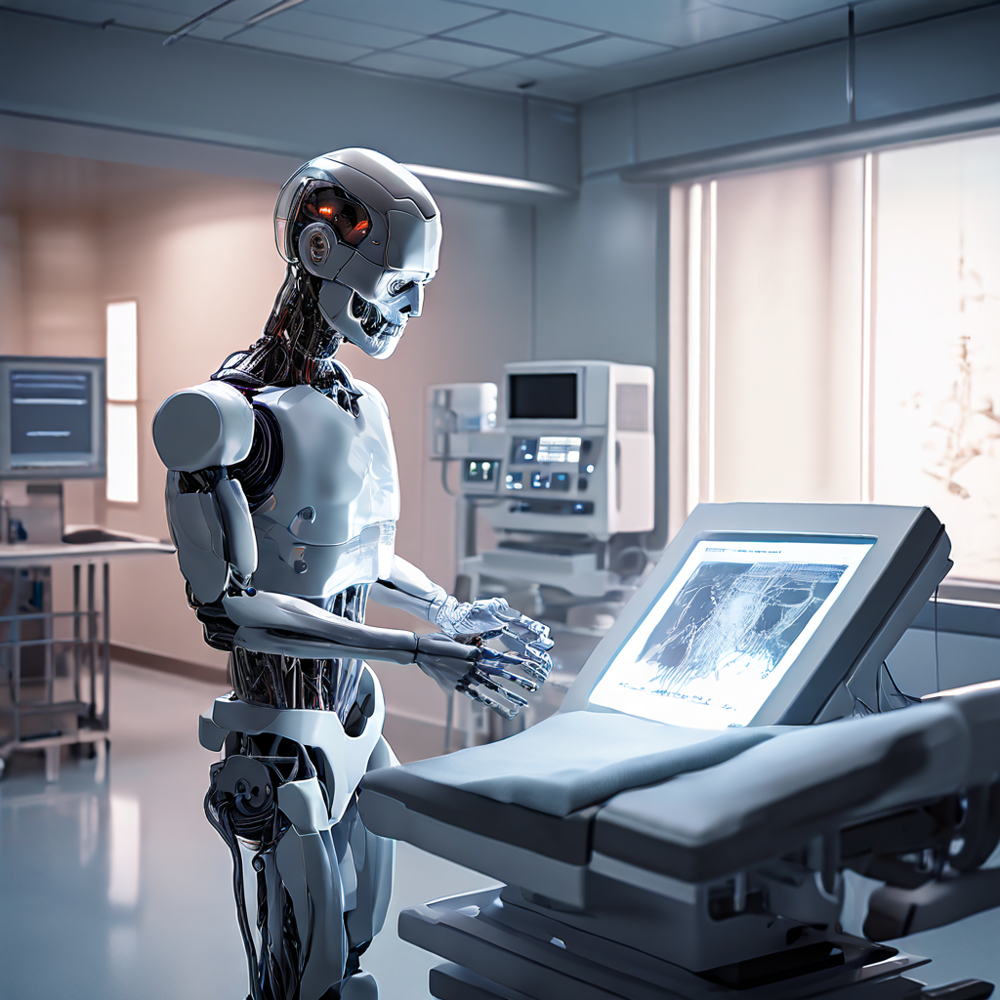

## Introduction

In modern healthcare, early detection and accurate diagnosis of diseases are critical for effective treatment and management. Traditional diagnostic methods often rely on invasive procedures and subjective assessments. However, the advent of predictive modeling using machine learning offers a promising avenue for enhancing disease diagnosis by leveraging vast amounts of health-related data. This project aims to develop a predictive model capable of accurately classifying individuals into diseased or non-diseased categories based on their health attributes, thereby assisting healthcare professionals in timely intervention and patient management.

## Objective

The objective of this project is to create a robust predictive model for disease diagnosis using machine learning techniques. By analyzing a comprehensive dataset containing various health-related attributes, including cholesterol levels, blood cell counts, hormone levels, and physiological measurements, the goal is to develop a tool that can accurately predict the likelihood of an individual having a specific disease. The ultimate aim is to assist healthcare providers in early disease detection, prognosis, and personalized patient care.

## Dataset Information

The dataset utilized in this project comprises a diverse set of health-related attributes collected from individuals, along with binary indicators denoting disease status (1 for diseased, 0 for non-diseased). The attributes encompass a wide range of physiological parameters, including cholesterol levels, blood cell counts, hormonal profiles, and cardiovascular markers. Each observation in the dataset represents an individual case, with accompanying measurements and disease status labels. The dataset offers a rich source of information for training and evaluating predictive models for disease diagnosis.

The dataset consists of the following attributes:
- **Cholesterol**: Level of cholesterol in the blood (mg/dL)
- **Hemoglobin**: Protein in red blood cells carrying oxygen
- **Platelets**: Blood cells aiding in clotting
- **White Blood Cells (WBC)**: Immune system cells fighting infections
- **Red Blood Cells (RBC)**: Cells carrying oxygen
- **Hematocrit**: Percentage of blood volume occupied by RBC
- **Mean Corpuscular Volume (MCV)**: Average volume of RBC
- **Mean Corpuscular Hemoglobin (MCH)**: Average amount of hemoglobin in RBC
- **Mean Corpuscular Hemoglobin Concentration (MCHC)**: Average concentration of hemoglobin in RBC
- **Insulin**: Hormone regulating blood sugar levels
- **BMI (Body Mass Index)**: Measure of body fat based on height and weight
- **Systolic Blood Pressure (SBP)**: Pressure in arteries during heartbeats
- **Diastolic Blood Pressure (DBP)**: Pressure in arteries at rest between beats
- **Triglycerides**: Type of fat found in blood (mg/dL)
- **HbA1c (Glycated Hemoglobin)**: Measure of average blood sugar levels over past 2-3 months
- **LDL (Low-Density Lipoprotein) Cholesterol**: "Bad" cholesterol
- **HDL (High-Density Lipoprotein) Cholesterol**: "Good" cholesterol
- **ALT (Alanine Aminotransferase)**: Liver enzyme
- **AST (Aspartate Aminotransferase)**: Enzyme found in liver and heart
- **Heart Rate**: Number of heartbeats per minute (bpm)
- **Creatinine**: Waste product produced by muscles and filtered by kidneys
- **Troponin**: Protein released into bloodstream during heart muscle damage
- **C-reactive Protein (CRP)**: Marker of inflammation in the body
- **Disease**: Binary indicator (1: Diseased, 0: Non-diseased)

## Research Question

The central research question driving this project is:

"Can machine learning algorithms accurately predict the likelihood of an individual having a specific disease based on their health attributes?"

## Approach of Analysis

1. **Data Exploration and Preprocessing**:
  - Explore the dataset to understand its structure, distribution, and characteristics.
  - Handle missing values, outliers, and perform necessary data preprocessing steps such as feature scaling and encoding categorical variables.
2. **Feature Selection and Engineering**:
  - Identify relevant features that contribute to disease prediction through correlation analysis, feature importance ranking, and domain knowledge.
  - Optionally, create new features or transformations to enhance the predictive power of the model.
3. **Model Selection and Training**:
  - Choose appropriate machine learning algorithms for classification tasks, such as logistic regression, decision trees, random forests, support vector machines (SVM), or gradient boosting machines (GBM).
  - Split the dataset into training and testing sets for model evaluation.
  - Train multiple models using the training data and optimize hyperparameters using techniques like cross-validation.
4. **Model Evaluation**:
  - Evaluate the trained models using performance metrics such as accuracy, precision, recall, F1-score, and area under the ROC curve (AUC-ROC).
  - Compare the performance of different models and select the one with the best overall performance.
5. **Model Interpretation**:
  - Interpret the trained model to understand the relative importance of features in predicting disease status.
  - Utilize techniques such as feature importance plots, SHAP values, and partial dependence plots for model interpretation.

## Imports

In [ ]:
!pip install -U ydata-profiling

In [ ]:
!pip install -U ydata-profiling[notebook]

In [ ]:
!pip install --q sweetviz

In [ ]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sweetviz as sv
from pandas_profiling import ProfileReport

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report

# Set plotting size and style
sns.set(rc = {'figure.figsize':(16, 8)})
sns.set_style("darkgrid")

In [ ]:
# Load the training dataset
train_data = pd.read_csv("Train_data.csv")

# Display the first few rows of the dataset
train_data.head()

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.74,0.65,0.71,0.87,0.69,0.53,0.29,0.63,0.00,0.80,...,0.50,0.22,0.51,0.06,0.61,0.94,0.10,0.47,0.77,Healthy
1,0.12,0.02,0.94,0.91,0.51,0.40,0.16,0.31,0.21,0.51,...,0.86,0.65,0.11,0.94,0.34,0.67,0.66,0.82,0.40,Diabetes
2,0.45,0.12,0.54,0.40,0.29,0.38,0.63,0.30,0.87,0.03,...,0.47,0.39,0.42,0.01,0.51,0.43,0.42,0.80,0.78,Thalasse
3,0.14,0.02,0.42,0.19,0.08,0.17,0.07,0.67,0.13,0.50,...,0.02,0.04,0.83,0.27,0.59,0.23,0.49,0.64,0.35,Anemia
4,0.18,0.75,0.97,0.79,0.44,0.44,0.89,0.44,0.26,0.81,...,0.43,0.15,0.22,0.02,0.57,0.84,0.15,0.79,0.09,Thalasse


In [ ]:
# Dataset overview
print("Dataset Overview:")
print("Number of Rows:", train_data.shape[0])
print("Number of Columns:", train_data.shape[1])
print("\nColumn Names:")
print(train_data.columns)

Dataset Overview:
Number of Rows: 2351
Number of Columns: 25

Column Names:
Index(['Glucose', 'Cholesterol', 'Hemoglobin', 'Platelets',
       'White Blood Cells', 'Red Blood Cells', 'Hematocrit',
       'Mean Corpuscular Volume', 'Mean Corpuscular Hemoglobin',
       'Mean Corpuscular Hemoglobin Concentration', 'Insulin', 'BMI',
       'Systolic Blood Pressure', 'Diastolic Blood Pressure', 'Triglycerides',
       'HbA1c', 'LDL Cholesterol', 'HDL Cholesterol', 'ALT', 'AST',
       'Heart Rate', 'Creatinine', 'Troponin', 'C-reactive Protein',
       'Disease'],
      dtype='object')


In [ ]:
# Summary statistics of numerical features
train_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Glucose,2351.0,0.362828,0.251889,0.010994,0.129198,0.351722,0.582278,0.968460
Cholesterol,2351.0,0.393648,0.239449,0.012139,0.195818,0.397083,0.582178,0.905026
Hemoglobin,2351.0,0.586190,0.271498,0.003021,0.346092,0.609836,0.791215,0.983306
Platelets,2351.0,0.504027,0.303347,0.012594,0.200865,0.533962,0.754841,0.999393
White Blood Cells,2351.0,0.511086,0.277270,0.010139,0.259467,0.527381,0.743164,0.990786
Red Blood Cells,2351.0,0.506590,0.266565,0.044565,0.263589,0.467431,0.743670,1.000000
Hematocrit,2351.0,0.507152,0.285537,0.011772,0.288132,0.493428,0.753657,0.977520
Mean Corpuscular Volume,2351.0,0.492200,0.275735,0.046942,0.287532,0.453052,0.722293,0.995263
Mean Corpuscular Hemoglobin,2351.0,0.484459,0.315618,0.000554,0.207938,0.420723,0.778160,0.963235
Mean Corpuscular Hemoglobin Concentration,2351.0,0.562273,0.273281,0.006947,0.355774,0.603635,0.741381,0.975586


In [ ]:
# Check for missing values
print("Missing values in the training dataset:")
train_data.isnull().sum()

Missing values in the training dataset:


Glucose                                      0
Cholesterol                                  0
Hemoglobin                                   0
Platelets                                    0
White Blood Cells                            0
Red Blood Cells                              0
Hematocrit                                   0
Mean Corpuscular Volume                      0
Mean Corpuscular Hemoglobin                  0
Mean Corpuscular Hemoglobin Concentration    0
Insulin                                      0
BMI                                          0
Systolic Blood Pressure                      0
Diastolic Blood Pressure                     0
Triglycerides                                0
HbA1c                                        0
LDL Cholesterol                              0
HDL Cholesterol                              0
ALT                                          0
AST                                          0
Heart Rate                                   0
Creatinine   

In [ ]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2351 entries, 0 to 2350
Data columns (total 25 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Glucose                                    2351 non-null   float64
 1   Cholesterol                                2351 non-null   float64
 2   Hemoglobin                                 2351 non-null   float64
 3   Platelets                                  2351 non-null   float64
 4   White Blood Cells                          2351 non-null   float64
 5   Red Blood Cells                            2351 non-null   float64
 6   Hematocrit                                 2351 non-null   float64
 7   Mean Corpuscular Volume                    2351 non-null   float64
 8   Mean Corpuscular Hemoglobin                2351 non-null   float64
 9   Mean Corpuscular Hemoglobin Concentration  2351 non-null   float64
 10  Insulin                 

In [ ]:
train_data['Disease'].unique()

array(['Healthy', 'Diabetes', 'Thalasse', 'Anemia', 'Thromboc'],
      dtype=object)

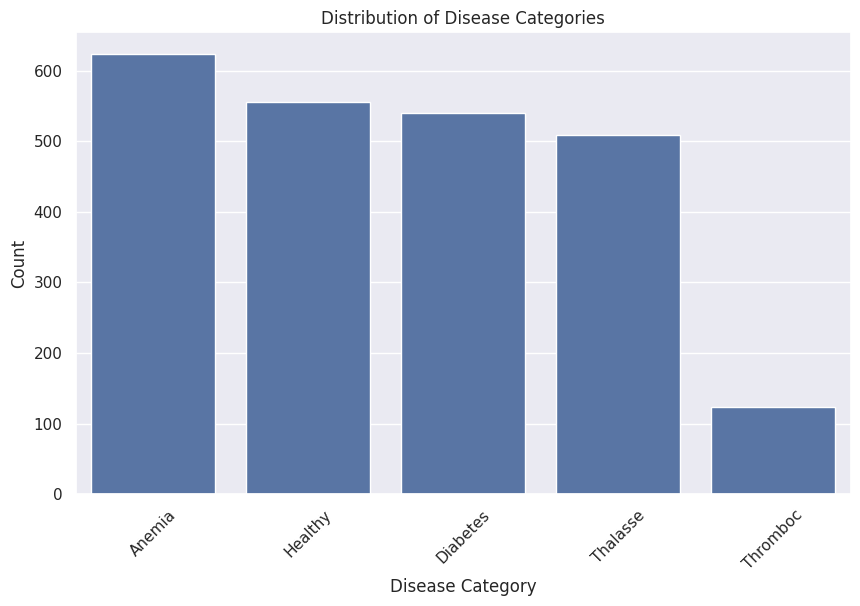

Count of each disease category:


Disease
Anemia      623
Healthy     556
Diabetes    540
Thalasse    509
Thromboc    123
Name: count, dtype: int64

In [ ]:
# Visualize the distribution of the target variable
plt.figure(figsize=(10, 6))
sns.countplot(x='Disease', data=train_data, order=train_data['Disease'].value_counts().index)
plt.title('Distribution of Disease Categories')
plt.xlabel('Disease Category')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Display the count of each disease category
print("Count of each disease category:")
train_data['Disease'].value_counts()

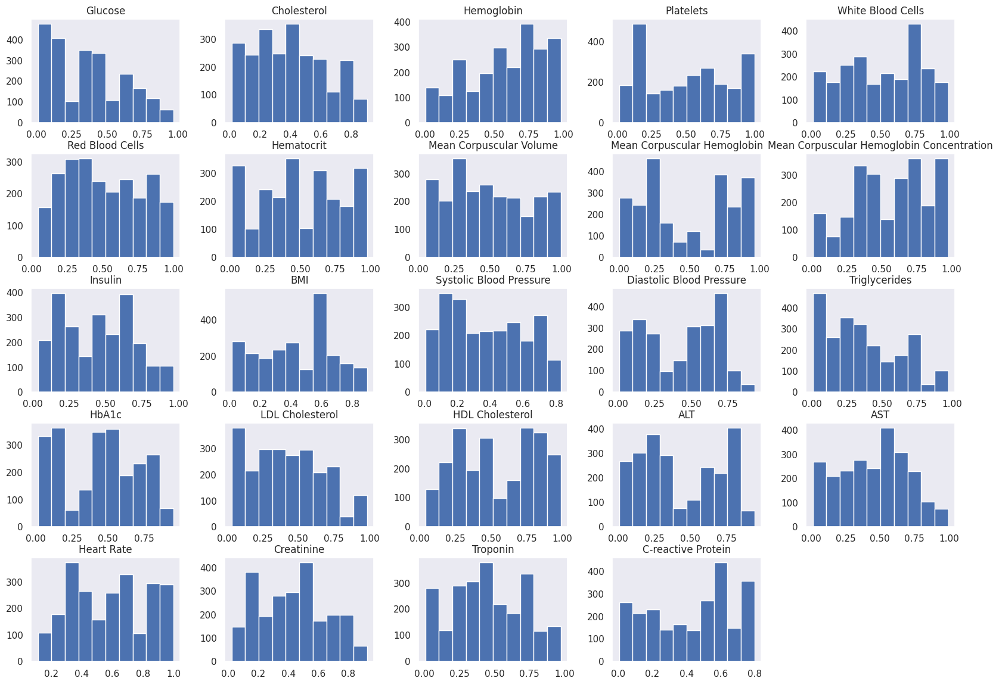

In [ ]:
# Data Visualization using histograms
train_data.hist(bins=10, grid=False, figsize=(20, 14))
plt.show()

In [ ]:
my_report = sv.analyze(train_data)
my_report.show_html('diagnosis_report_sweetviz.html')

                                             |          | [  0%]   00:00 -> (? left)

Report diagnosis_report_sweetviz.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.



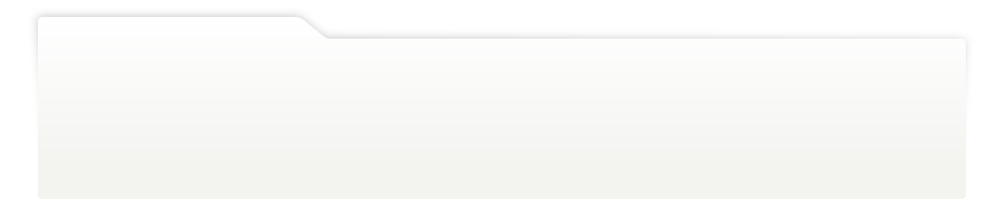
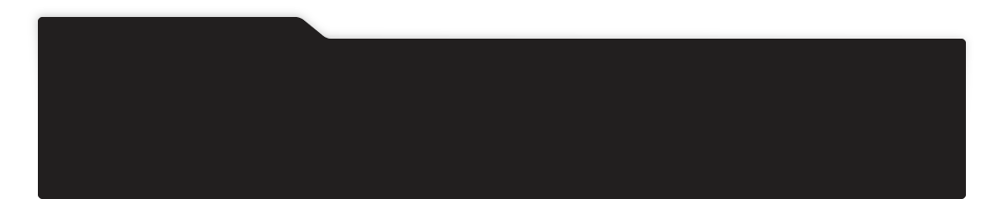
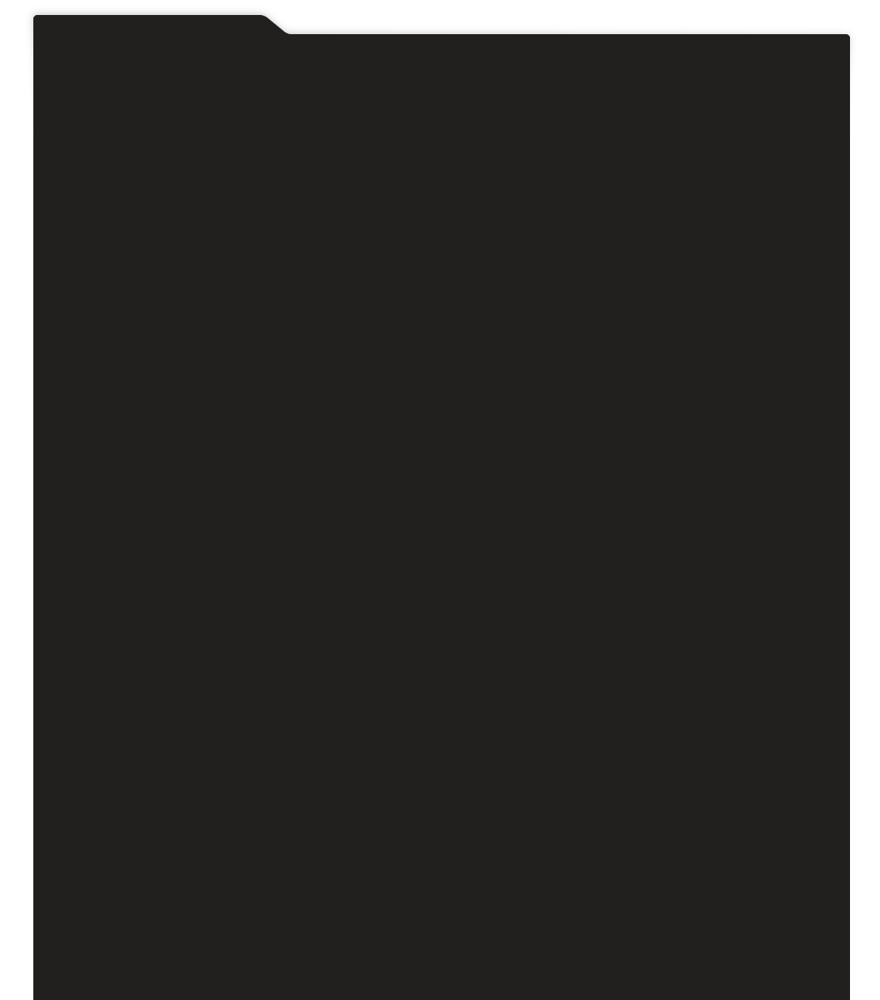
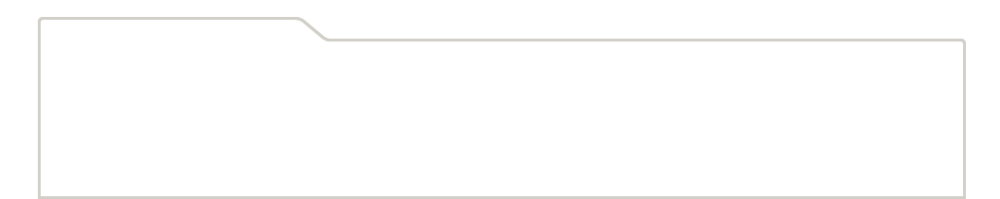
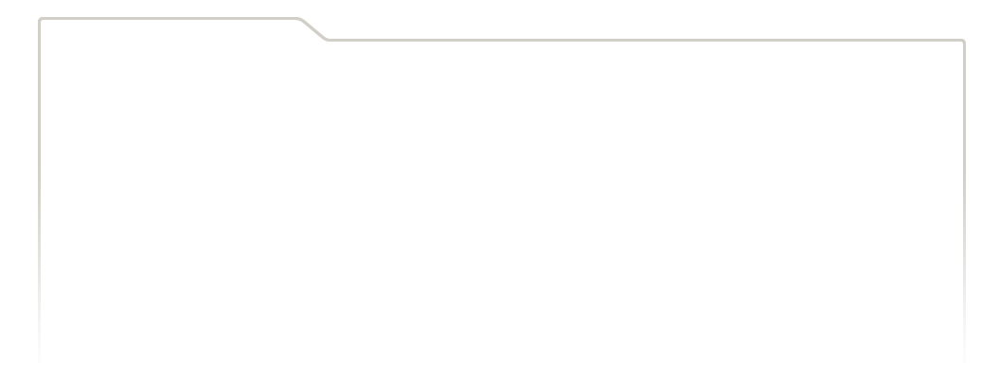
...
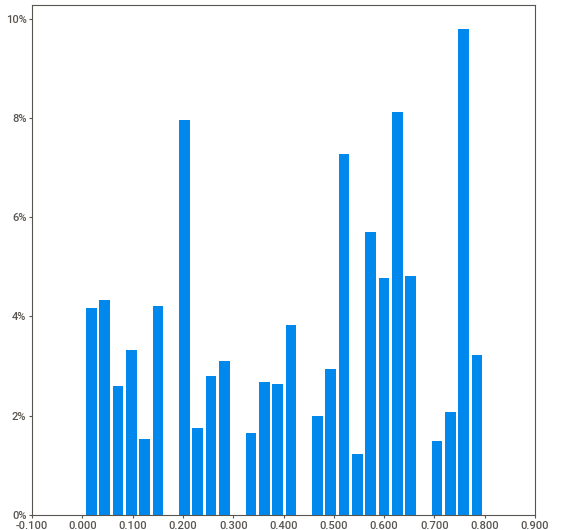
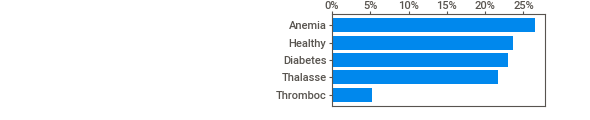
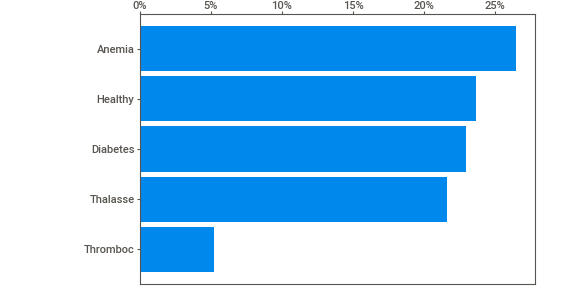
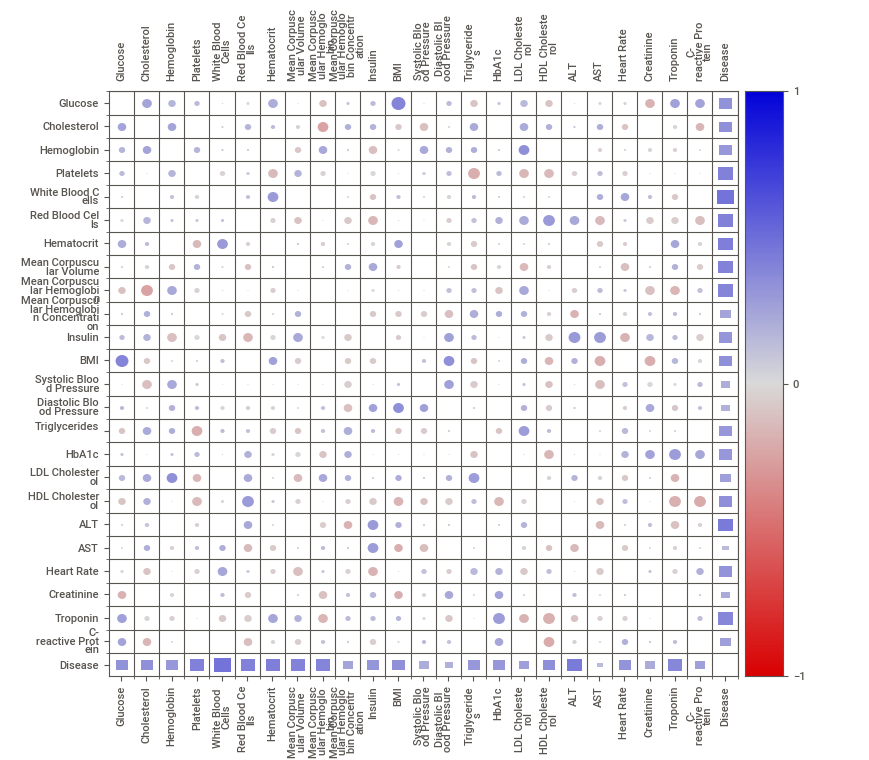
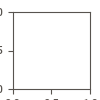

In [ ]:
my_report.show_notebook(  w=None,
                h=None,
                scale=None,
                layout='widescreen',
                filepath=None)

In [ ]:
profile = ProfileReport(train_data, title="Profiling Report")
profile.to_file("diagnosis_report_profiling.html")

/usr/local/lib/python3.10/dist-packages/ydata_profiling/profile_report.py:363: UserWarning: Try running command: 'pip install --upgrade Pillow' to avoid ValueError
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
numerical_cols = train_data.columns[train_data.dtypes != 'object']
numerical_cols

Index(['Glucose', 'Cholesterol', 'Hemoglobin', 'Platelets',
       'White Blood Cells', 'Red Blood Cells', 'Hematocrit',
       'Mean Corpuscular Volume', 'Mean Corpuscular Hemoglobin',
       'Mean Corpuscular Hemoglobin Concentration', 'Insulin', 'BMI',
       'Systolic Blood Pressure', 'Diastolic Blood Pressure', 'Triglycerides',
       'HbA1c', 'LDL Cholesterol', 'HDL Cholesterol', 'ALT', 'AST',
       'Heart Rate', 'Creatinine', 'Troponin', 'C-reactive Protein'],
      dtype='object')

In [ ]:
# Selecting numerical features (excluding the 'Disease' column)
numerical_features = train_data.select_dtypes(include=[np.number])

# Calculate the first quartile (Q1) and third quartile (Q3)
Q1 = numerical_features.quantile(0.25)
Q3 = numerical_features.quantile(0.75)

# Calculate the interquartile range (IQR)
IQR = Q3 - Q1

# Define the outlier threshold
threshold = 1.5

# Detect outliers
outliers = ((numerical_features < (Q1 - threshold * IQR)) | (numerical_features > (Q3 + threshold * IQR))).any(axis=1)

# Count the number of outliers
num_outliers = outliers.sum()
print("Number of outliers detected:", num_outliers)

# Display the outliers
print("\nOutlier rows:")
train_data[outliers]

Number of outliers detected: 0

Outlier rows:


,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease


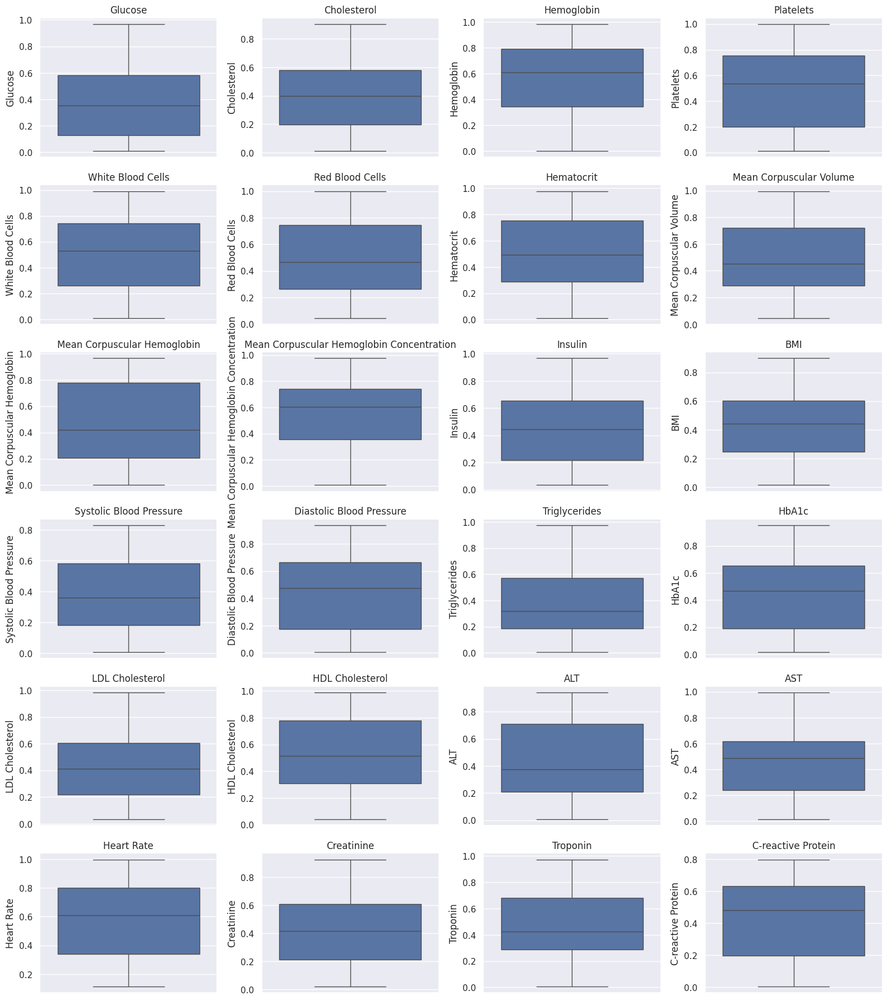

In [ ]:
# Box plots to visualize the distribution of each numerical feature
plt.figure(figsize=(16, 18))
for i, col in enumerate(numerical_cols, 1):
    plt.subplot(6, 4, i)
    sns.boxplot(train_data[col])
    plt.title(col)
plt.tight_layout()
plt.show()

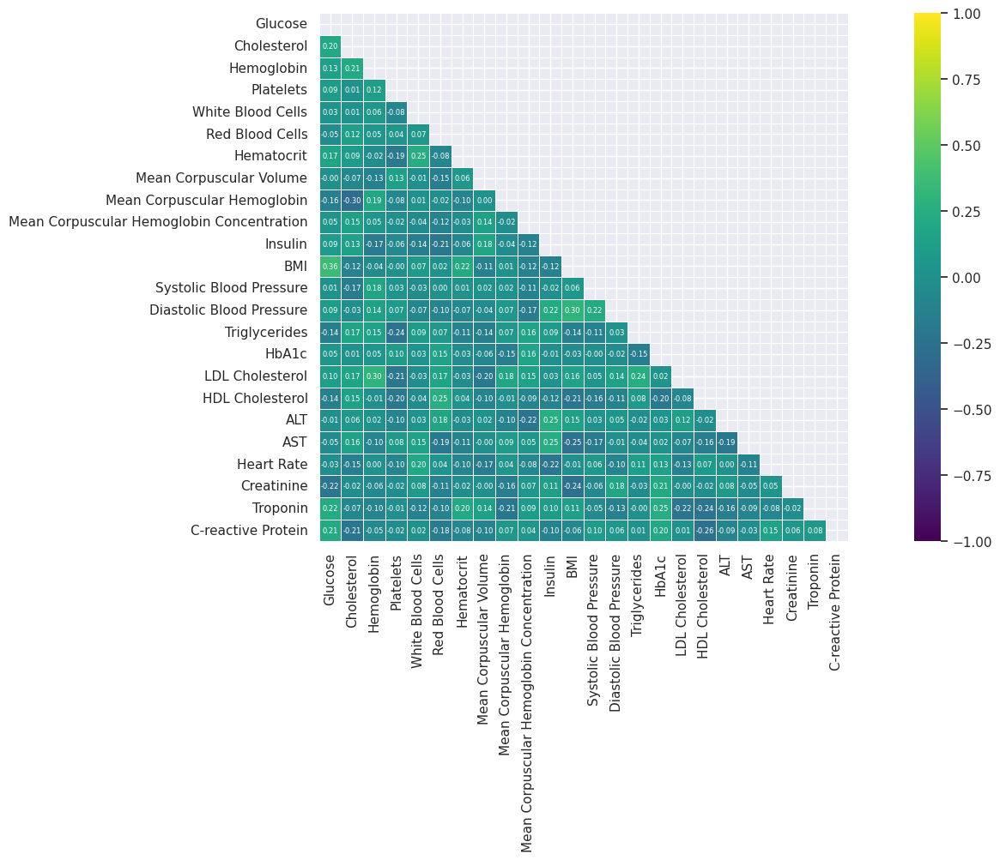

In [ ]:
# Calculate the correlation matrix
correlation_matrix = train_data.drop("Disease", axis=1).corr()

# Create a mask using numpy's triu function
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Create a masked heatmap
plt.figure(figsize = (20,8))
plt.rcParams.update({'font.size': 6})
sns.heatmap(correlation_matrix, cmap = 'viridis', vmin = -1, vmax = 1, center = 0, annot=True, fmt=".2f", square=True, linewidths=.5, mask = mask)
plt.show()

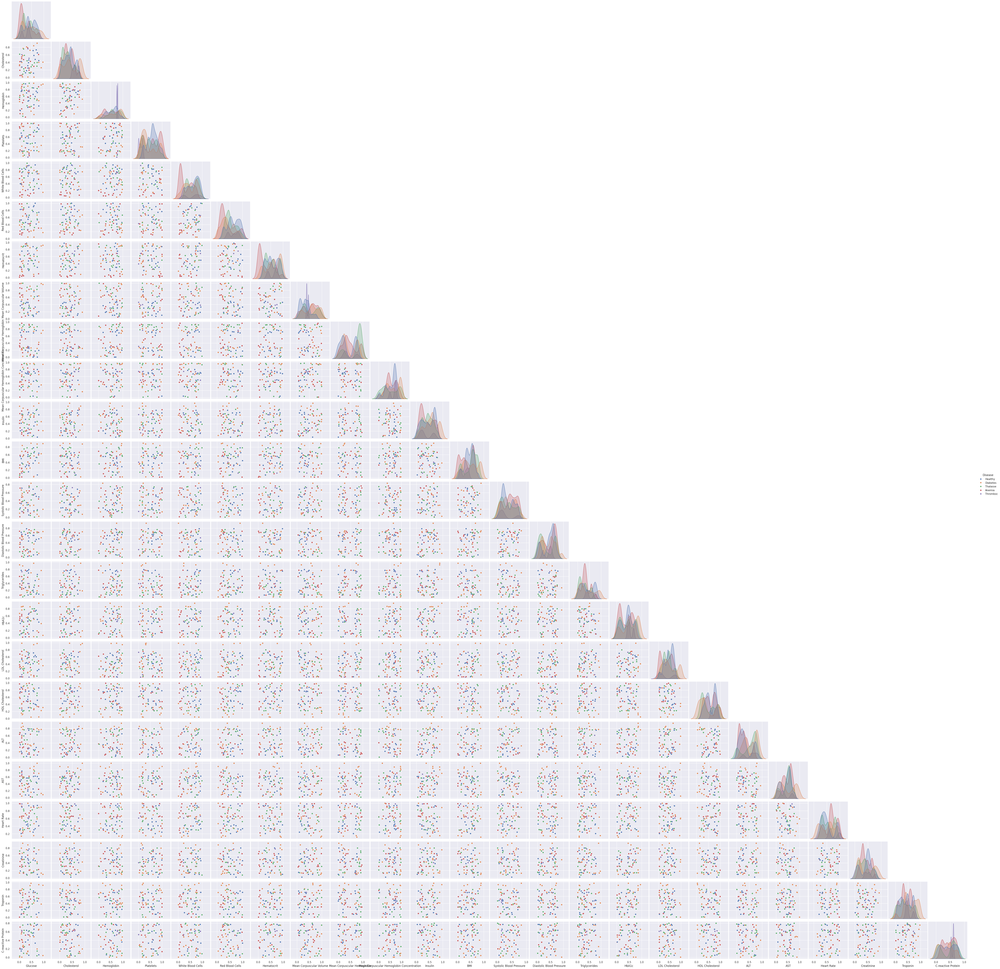

In [ ]:
sns.pairplot(train_data, hue="Disease", corner=True)
plt.show()

## Modeling

In [ ]:
from imblearn.over_sampling import RandomOverSampler

# Instantiate RandomOverSampler
oversampler = RandomOverSampler(random_state=42)

# Perform oversampling
X_resampled, y_resampled = oversampler.fit_resample(train_data.drop(columns=['Disease']), train_data['Disease'])

# Convert X_resampled and y_resampled back to DataFrame
train_data_resampled = pd.concat([pd.DataFrame(X_resampled, columns=train_data.drop(columns=['Disease']).columns), pd.Series(y_resampled, name='Disease')], axis=1)

# Check the new class distribution
print("New class distribution after oversampling:")
print(train_data_resampled['Disease'].value_counts())

New class distribution after oversampling:
Disease
Healthy     623
Diabetes    623
Thalasse    623
Anemia      623
Thromboc    623
Name: count, dtype: int64


In [ ]:
# Load the test dataset
test_data = pd.read_csv("test_data.csv")

# Display the first few rows of the test dataset
test_data.head()

,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
0,0.00,0.03,0.11,1.00,0.56,0.87,0.58,0.91,0.03,0.04,...,0.65,0.19,0.43,0.02,0.89,0.65,0.79,0.05,0.03,Thalasse
1,0.44,0.97,0.08,0.18,0.68,0.56,0.80,0.67,0.38,0.18,...,0.83,0.15,0.46,0.40,0.64,0.57,0.05,0.61,0.59,Diabetes
2,0.55,0.32,0.58,0.48,0.56,0.66,0.93,0.38,0.50,0.53,...,0.68,0.22,0.82,0.69,0.10,0.86,0.55,0.41,0.07,Heart Di
3,0.17,0.05,0.74,0.78,0.07,0.09,0.03,0.46,0.79,0.49,...,0.38,0.46,0.42,0.80,0.40,0.32,0.50,0.44,0.24,Diabetes
4,0.76,0.74,0.60,0.77,0.88,0.86,0.49,0.49,0.62,0.19,...,0.99,0.27,0.66,0.27,0.92,0.80,0.57,0.19,0.75,Heart Di


In [ ]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 486 entries, 0 to 485
Data columns (total 25 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Glucose                                    486 non-null    float64
 1   Cholesterol                                486 non-null    float64
 2   Hemoglobin                                 486 non-null    float64
 3   Platelets                                  486 non-null    float64
 4   White Blood Cells                          486 non-null    float64
 5   Red Blood Cells                            486 non-null    float64
 6   Hematocrit                                 486 non-null    float64
 7   Mean Corpuscular Volume                    486 non-null    float64
 8   Mean Corpuscular Hemoglobin                486 non-null    float64
 9   Mean Corpuscular Hemoglobin Concentration  486 non-null    float64
 10  Insulin                   

In [ ]:
test_data['Disease'].value_counts()

Disease
Diabetes    294
Anemia       84
Thalasse     48
Heart Di     39
Thromboc     16
Healthy       5
Name: count, dtype: int64

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

# Splitting features and target variable
X = train_data_resampled.drop(columns=['Disease'])
y = train_data_resampled['Disease']

# Splitting the dataset into train and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Label encoding for target variable
le = LabelEncoder()
y_train_encoded = le.fit_transform(y_train)
y_val_encoded = le.transform(y_val)

# Initialize models
models = {
    "RandomForest": RandomForestClassifier(random_state=42),
    "SVM": SVC(random_state=42)
}

# Train and evaluate models
for name, model in models.items():
    print(f"Training {name}...")
    model.fit(X_train, y_train_encoded)
    y_pred = model.predict(X_val)
    print(f"Evaluating {name}...")
    print(classification_report(y_val_encoded, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_val_encoded, y_pred))
    print(f"Accuracy: {accuracy_score(y_val_encoded, y_pred)}")
    print("\n")

Training RandomForest...
Evaluating RandomForest...
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       123
           1       1.00      1.00      1.00       128
           2       1.00      1.00      1.00       122
           3       1.00      1.00      1.00       137
           4       1.00      1.00      1.00       113

    accuracy                           1.00       623
   macro avg       1.00      1.00      1.00       623
weighted avg       1.00      1.00      1.00       623

Confusion Matrix:
[[123   0   0   0   0]
 [  0 128   0   0   0]
 [  0   0 122   0   0]
 [  0   0   0 137   0]
 [  0   0   0   0 113]]
Accuracy: 1.0


Training SVM...
Evaluating SVM...
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       123
           1       1.00      1.00      1.00       128
           2       1.00      1.00      1.00       122
           3       1.00      1.00      1.00       137
    

In [ ]:
# Identify duplicates
duplicate_rows = combined_data_encoded[combined_data_encoded.duplicated()]

# Display the duplicate rows
print("Duplicate Rows:")
duplicate_rows

Duplicate Rows:


,Glucose,Cholesterol,Hemoglobin,Platelets,White Blood Cells,Red Blood Cells,Hematocrit,Mean Corpuscular Volume,Mean Corpuscular Hemoglobin,Mean Corpuscular Hemoglobin Concentration,...,HbA1c,LDL Cholesterol,HDL Cholesterol,ALT,AST,Heart Rate,Creatinine,Troponin,C-reactive Protein,Disease
9,0.40,0.51,0.78,0.10,0.93,0.65,0.68,0.38,0.25,0.49,...,0.67,0.03,0.77,0.25,0.32,0.66,0.77,0.71,0.61,5
21,0.72,0.30,0.49,0.20,0.40,0.73,0.85,0.82,0.11,0.01,...,0.02,0.06,0.64,0.72,0.42,0.64,0.21,0.55,0.04,4
24,0.02,0.62,0.58,0.56,0.84,0.48,0.30,0.72,0.92,0.22,...,0.08,0.46,0.29,0.69,0.71,0.30,0.72,0.30,0.03,4
25,0.38,0.39,0.58,0.57,0.69,0.61,0.47,0.10,0.72,0.32,...,0.65,0.66,0.31,0.26,0.40,0.60,0.48,0.28,0.61,2
26,0.03,0.05,0.10,0.22,0.15,0.22,0.31,0.61,0.49,0.45,...,0.19,0.33,0.56,0.68,0.10,0.98,0.44,0.29,0.71,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3110,0.35,0.76,0.76,0.01,0.23,0.43,0.39,0.46,0.31,0.74,...,0.45,0.73,0.62,0.79,0.23,0.61,0.41,0.43,0.53,5
3111,0.40,0.51,0.78,0.10,0.93,0.65,0.68,0.38,0.25,0.49,...,0.67,0.03,0.77,0.25,0.32,0.66,0.77,0.71,0.61,5
3112,0.11,0.60,0.79,0.18,0.72,0.83,0.75,0.40,0.76,0.73,...,0.49,0.10,0.86,0.61,0.68,0.98,0.55,0.47,0.62,5
3113,0.11,0.60,0.79,0.18,0.72,0.83,0.75,0.40,0.76,0.73,...,0.49,0.10,0.86,0.61,0.68,0.98,0.55,0.47,0.62,5


In [ ]:
# Separate features and target variable
X = train_data.drop(columns=['Disease'])
y = train_data['Disease']

In [ ]:
# Oversample the minority classes using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

In [ ]:
X_resampled.shape

(3115, 24)

In [ ]:
y_resampled.shape

(3115,)

In [ ]:
# Model selection
models = {
    "Random Forest": RandomForestClassifier(random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(random_state=42),
    "SVM": SVC(kernel='linear', random_state=42)  # Linear kernel for faster training
}

In [ ]:
# Evaluate models using cross-validation
for name, model in models.items():
    scores = cross_val_score(model, X_resampled, y_resampled, cv=5, scoring='f1_weighted')
    print(f"{name}: Mean F1-score: {scores.mean():.2f}, Std: {scores.std():.2f}")

Random Forest: Mean F1-score: 1.00, Std: 0.00
Gradient Boosting: Mean F1-score: 1.00, Std: 0.00
SVM: Mean F1-score: 1.00, Std: 0.00


In [ ]:
# Train the best-performing model
best_model = GradientBoostingClassifier(random_state=42)
best_model.fit(X_resampled, y_resampled)

# Print classification report for the best model
y_pred = best_model.predict(X)
print("Classification Report:")
print(classification_report(y, y_pred))

Classification Report:
              precision    recall  f1-score   support

      Anemia       1.00      1.00      1.00       623
    Diabetes       1.00      1.00      1.00       540
     Healthy       1.00      1.00      1.00       556
    Thalasse       1.00      1.00      1.00       509
    Thromboc       1.00      1.00      1.00       123

    accuracy                           1.00      2351
   macro avg       1.00      1.00      1.00      2351
weighted avg       1.00      1.00      1.00      2351



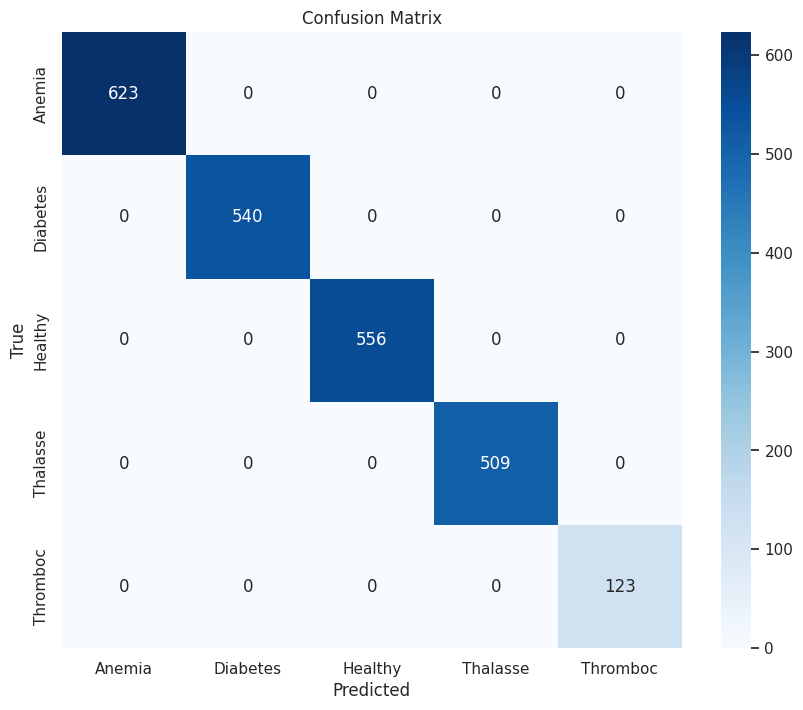

In [ ]:
from sklearn.metrics import confusion_matrix

# Generate confusion matrix
conf_matrix = confusion_matrix(y, y_pred)

# Plot confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=best_model.classes_, yticklabels=best_model.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()